In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
# import gseapy
import matplotlib.pyplot as plt
import warnings
import os

from sklearn.cluster import KMeans
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from anndata import AnnData
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import anndata as ad
import tifffile as tiff
import pickle

from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list, fcluster
from scipy.spatial.distance import pdist
from sklearn.cluster import AgglomerativeClustering

np.random.seed(42)

warnings.simplefilter(action="ignore", category=Warning)
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['pdf.fonttype'] = 42  # Ensures text is stored as editable Type 1 fonts
plt.rcParams['ps.fonttype'] = 42   # For EPS compatibility

# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 0

sc.settings.set_figure_params(dpi=100)

meta_info = pd.read_csv("../../data/meta_info_lung.csv")
data_path = '/ewsc/wuqitian/lung_preprocess'
pred_path = '/ewsc/wuqitian/analysis_pred_data'

cell_lineage = ['Epithelial', 'Immune', 'Endothelial', 'Mesenchymal']
cl_map = {c: i for i, c in enumerate(cell_lineage)}
cl_map_inv = {i: c for i, c in enumerate(cell_lineage)}
cell_type = ['RASC', 'Secretory', 'Multiciliated', 'PNEC', 'Basal', 'Goblet', 'Proliferating Airway', 'AT2', 'Transitional AT2', 'AT1', 
             'KRT5-/KRT17+', 'Proliferating AT2', 'Langerhans cells', 'NK/NKT', 'Tregs', 'CD4+ T-cells', 'CD8+ T-cells', 
             'Proliferating T-cells', 'B cells', 'Plasma', 'pDCs', 'Proliferating NK/NKT', 'Proliferating B cells', 'cDCs', 'Mast', 
             'Interstitial Macrophages', 'Alveolar Macrophages', 'SPP1+ Macrophages', 'Neutrophils', 'Proliferating Myeloid', 
             'Migratory DCs', 'Macrophages - IFN-activated', 'Monocytes/MDMs', 'Basophils', 'Venous', 'Capillary', 'Lymphatic', 
             'Arteriole', 'SMCs/Pericytes', 'Alveolar FBs', 'Proliferating FBs', 'Inflammatory FBs', 'Activated Fibrotic FBs', 
             'Myofibroblasts', 'Subpleural FBs', 'Adventitial FBs', 'Mesothelial']
ct_map = {c: i for i, c in enumerate(cell_type)}
ct_map_inv = {i: c for i, c in enumerate(cell_type)}

# Endothelial: 'Venous', 'Arteriole', 'Lymphatic', 'Capillary'
# Epithelial: 'RASC', 'Goblet', 'Multiciliated', 'Basal', 'Secretory', 'PNEC', 'Proliferating Airway', 
#     'AT1', 'KRT5-/KRT17+', 'AT2', 'Transitional AT2', 'Proliferating AT2'
# Immune: 'Langerhans cells', 'NK/NKT', 'CD8+ T-cells', 'CD4+ T-cells', 'pDCs', 'B cells', 'Tregs', 'Plasma', 'Proliferating T-cells', 
#     'Proliferating B cells', 'Proliferating NK/NKT', 'cDCs', 'Mast', 'Monocytes/MDMs', 'Interstitial Macrophages', 'Migratory DCs', 
#     'Macrophages - IFN-activated', 'Proliferating Myeloid', 'Neutrophils', 'Alveolar Macrophages', 'SPP1+ Macrophages', 'Basophils'
# Mesenchymal: 'Alveolar FBs', 'SMCs/Pericytes', 'Activated Fibrotic FBs', 'Inflammatory FBs', 'Adventitial FBs', 'Proliferating FBs', 
#     'Myofibroblasts', 'Subpleural FBs', 'Mesothelial'

cell_type_agg_map = {
    'Venous': 'Venous', 'Arteriole': 'Arteriole', 'Lymphatic': 'Lymphatic', 'Capillary': 'Capillary',
    'AT1': 'AT1', 'AT2': 'AT2', 'Transitional AT2': 'AT2', 'Proliferating AT2': 'AT2', 'KRT5-/KRT17+': 'KRT5-/KRT17+',
    'RASC': 'RASC', 'Goblet': 'Goblet', 'Multiciliated': 'Multiciliated', 'Basal': 'Basal', 'Secretory': 'Secretory', 'PNEC': 'PNEC', 'Proliferating Airway': 'Airway',
    'B cells': 'B cells', 'Proliferating B cells': 'B cells', 'CD8+ T-cells': 'T cells', 'CD4+ T-cells': 'T cells', 'Proliferating T-cells': 'T cells', 'NK/NKT': 'NK/NKT', 'Proliferating NK/NKT': 'NK/NKT',
    'Langerhans cells': 'Langerhans cells', 'pDCs': 'DCs', 'cDCs': 'DCs', 'Migratory DCs': 'DCs', 'Tregs': 'Tregs', 'Plasma': 'Plasma',  
    'Mast': 'Mast', 'Monocytes/MDMs': 'Monocytes/MDMs', 'Proliferating Myeloid': 'Myeloid', 'Neutrophils': 'Neutrophils', 'Basophils': 'Basophils',
    'Interstitial Macrophages': 'Macrophages', 'Macrophages - IFN-activated': 'Macrophages', 'Alveolar Macrophages': 'Macrophages', 'SPP1+ Macrophages': 'Macrophages',
    'Alveolar FBs': 'Fibroblasts', 'Activated Fibrotic FBs': 'Fibroblasts', 'Inflammatory FBs': 'Fibroblasts', 'Adventitial FBs': 'Fibroblasts', 'Proliferating FBs': 'Fibroblasts', 'Subpleural FBs': 'Fibroblasts',
    'SMCs/Pericytes': 'Smooth muscle cells', 'Myofibroblasts': 'Myofibroblasts', 'Mesothelial': 'Mesothelial'
}

def pearson_score(y_true, y_pred, rank_axis='by_gene'):

    axis = 1 if rank_axis == 'by_gene' else 0

    matrix1 = y_true - np.mean(y_true, axis=axis, keepdims=True)
    matrix2 = y_pred - np.mean(y_pred, axis=axis, keepdims=True)

    covariance = np.sum(matrix1 * matrix2, axis=axis, keepdims=True)

    std1 = np.sqrt(np.sum(matrix1 ** 2, axis=axis, keepdims=True))
    std2 = np.sqrt(np.sum(matrix2 ** 2, axis=axis, keepdims=True))

    std_prod = std1 * std2

    if rank_axis == 'by_gene':
        nonzero = std_prod.nonzero()[0]
        corrs = covariance[nonzero] / std_prod[nonzero]
    else:
        nonzero = std_prod.nonzero()[1]
        corrs = covariance[:, nonzero] / std_prod[:, nonzero]

    return np.mean(corrs)

def spearman_score(y_true, y_pred, rank_axis='by_gene'):

    axis = 1 if rank_axis == 'by_gene' else 0

    ranked_matrix1 = np.apply_along_axis(rankdata, axis=axis, arr=y_true)
    ranked_matrix2 = np.apply_along_axis(rankdata, axis=axis, arr=y_pred)

    ranked_matrix1 -= np.mean(ranked_matrix1, axis=axis, keepdims=True)
    ranked_matrix2 -= np.mean(ranked_matrix2, axis=axis, keepdims=True)

    covariance = np.sum(ranked_matrix1 * ranked_matrix2, axis=axis, keepdims=True)

    std1 = np.sqrt(np.sum(ranked_matrix1 ** 2, axis=axis, keepdims=True))
    std2 = np.sqrt(np.sum(ranked_matrix2 ** 2, axis=axis, keepdims=True))

    std_prod = std1 * std2

    if rank_axis == 'by_gene':
        nonzero = std_prod.nonzero()[0]
        corrs = covariance[nonzero] / std_prod[nonzero]
    else:
        nonzero = std_prod.nonzero()[1]
        corrs = covariance[:, nonzero] / std_prod[:, nonzero]

    return np.mean(corrs)

def normalize(x):
    return (x - x.min()) / (x.max() - x.min())

def logit(x):
    x = np.clip(x, 1e-15, 1 - 1e-15)
    return np.log(np.divide(x, 1 - x))

def logit_inv(x):
    return 1 / (1 + np.exp(-x))

In [19]:
import sys
sys.path.append(os.path.abspath("../"))
import torch
from torch_cluster import knn_graph
import encoders
from models.pretrain import Model_Pretrain

device = "cpu"
gene_embeddings = torch.zeros((23258, 256), dtype=torch.float).to(device)
gene_embeddings = gene_embeddings
encoder1 = encoders.Transformer(in_channels=1536, hidden_channels=1024, num_layers_prop=2, num_layers_mlp=2, num_attn_heads=1,
                                        dropout=0., use_bn=True, use_graph=True, use_residual=True).to(device)
encoder2 = encoders.MLP(in_channels=256, hidden_channels=1024, num_layers=1, dropout=0.).to(device)
model_pretrain = Model_Pretrain(encoder1, encoder2, gene_embeddings, reg_w=0.5, ge_trainable=True, ge_pretrained=False).to(device)
    
pretrained_state_dict = torch.load('../../model_checkpoints/ours_pretrain_xenium_lung+.pth')
model_pretrain.load_state_dict(pretrained_state_dict)
model_pretrain.eval()

def get_embs_attns(adata):
    gene_index = adata.var['gene_filtered_idx']
    
    cell_image_emb = adata.obsm['embeddings']
    inputs = torch.tensor(cell_image_emb, dtype=torch.float).to(device)
    cell_by_gene = adata.layers['X_log1p']
    y_ge = torch.tensor(cell_by_gene, dtype=torch.float).to(device)
    
    cell_location = torch.tensor(adata.obsm['centroids'], dtype=torch.float)
    edge_index = knn_graph(cell_location, k=5, loop=False).to(device)
    
    with torch.no_grad():
        image_embs_ours, gene_embs_ours = model_pretrain(inputs, y_ge, gene_index, edge_index)
        image_embs_ours, gene_embs_ours = image_embs_ours.cpu().numpy(), gene_embs_ours.cpu().numpy()
        embs_ours = model_pretrain.encoder1.get_embeddings(inputs, edge_index).cpu().numpy() # [layer num, spot num, hidden size]
        attn_ours = model_pretrain.encoder1.get_attentions(inputs, edge_index).cpu().numpy() # [layer num, spot num, spot num]
    
    print(embs_ours.shape, attn_ours.shape)
    return embs_ours, attn_ours

def get_attn(attn_score, cell_types, lumen_ranks, select_lumen, macrophage_type="SPP1+ Macrophages"):
    cell_lumen_mask = lumen_ranks==select_lumen
    cell_lumen_query_mask = cell_lumen_mask * (cell_types == "Activated Fibrotic FBs")
    cell_lumen_key_mask = cell_lumen_mask * (cell_types == macrophage_type)
    cell_lumen_out_mask = ~cell_lumen_mask * (cell_types == macrophage_type)

    if cell_lumen_query_mask.sum() == 0 or cell_lumen_key_mask.sum() == 0:
        return -1, -1
    
    attn_in_score = attn_score[np.ix_(cell_lumen_query_mask, cell_lumen_key_mask)]
    attn_out_score = attn_score[np.ix_(cell_lumen_query_mask, cell_lumen_out_mask)]
    
    return attn_in_score.mean(0), attn_out_score.mean(0)

In [40]:
res_path = '/ewsc/wuqitian/analysis_pred_data/embs_attns'

cell_type = ['RASC', 'Secretory', 'Multiciliated', 'PNEC', 'Basal', 'Goblet', 'Proliferating Airway', 'AT2', 'Transitional AT2', 'AT1', 
             'KRT5-/KRT17+', 'Proliferating AT2', 'Langerhans cells', 'NK/NKT', 'Tregs', 'CD4+ T-cells', 'CD8+ T-cells', 
             'Proliferating T-cells', 'B cells', 'Plasma', 'pDCs', 'Proliferating NK/NKT', 'Proliferating B cells', 'cDCs', 'Mast', 
             'Interstitial Macrophages', 'Alveolar Macrophages', 'SPP1+ Macrophages', 'Neutrophils', 'Proliferating Myeloid', 
             'Migratory DCs', 'Macrophages - IFN-activated', 'Monocytes/MDMs', 'Basophils', 'Venous', 'Capillary', 'Lymphatic', 
             'Arteriole', 'SMCs/Pericytes', 'Alveolar FBs', 'Proliferating FBs', 'Inflammatory FBs', 'Activated Fibrotic FBs', 
             'Myofibroblasts', 'Subpleural FBs', 'Adventitial FBs', 'Mesothelial']

def get_attn_ct_by_ct(attn_matrix, cell_type_int, i_mask, j_mask):
    attn_ct_by_ct = np.zeros((len(cell_type), len(cell_type)), dtype=float)
    for i, ct_i in enumerate(cell_type):
        mask_i = (cell_type_int == ct_map[ct_i]) * i_mask
        if mask_i.sum() == 0:
            attn_ct_by_ct[i, :] = 0.
            continue
        attn_i = attn_matrix[mask_i]
        for j, ct_j in enumerate(cell_type):
            mask_j = (cell_type_int == ct_map[ct_j]) * j_mask
            if mask_j.sum() == 0:
                attn_ct_by_ct[i, j] = 0.
            else:
                attn_ij = attn_i[:, mask_j].mean()
                attn_ct_by_ct[i, j] = np.nan_to_num(attn_ij, nan=0.)
    return attn_ct_by_ct

lumen_ranks_merge = []
lumen_embs_merge = []
lumen_attns_inner_0_merge, lumen_attns_inner_1_merge = [], []
lumen_attns_outer_0_merge, lumen_attns_outer_1_merge = [], []
sample_merge = []
patho_merge = []
split_merge = []
for sample in train_samples+test_samples1+test_samples2:
    file_path = os.path.join(res_path, sample) + '.h5ad'
    adata = sc.read(file_path)
    if adata.shape[0]>100000:
        continue
    idx = np.arange(adata.shape[0])
    cell_type_int = adata.obs['final_CT'].to_numpy()
    embs, attns = get_embs_attns(adata)

    centroids = adata.obsm['centroids']
    x, y = centroids[:, 0], centroids[:, 1]
    
    for i, rank in enumerate(adata.obs['lumen_rank'].unique()):
        if ~np.isnan(rank):
            lumen_ranks_merge.append(rank)
            lumen_mask = (adata.obs['lumen_rank'] == rank).to_numpy()

            x_sub, y_sub = x[lumen_mask], y[lumen_mask]
            x_min, x_max, y_min, y_max = np.min(x_sub), np.max(x_sub), np.min(y_sub), np.max(y_sub)
            x_min, x_max, y_min, y_max = x_min - 200, x_max + 200, y_min - 200, y_max + 200
            back_mask = (x >= x_min) & (x <= x_max) & (y >= y_min) & (y <= y_max)
            
            lumen_embs = embs[-1][lumen_mask].mean(0) 
            lumen_embs_merge.append(lumen_embs)

            attns_0 = attns[0] + 1
            attns_0 = attns_0 / attns_0.sum(-1, keepdims=True)
            lumen_attns_inner_0 = get_attn_ct_by_ct(attns_0, cell_type_int, lumen_mask, lumen_mask)
            lumen_attns_outer_0 = get_attn_ct_by_ct(attns_0, cell_type_int, lumen_mask, back_mask)

            attns_1 = attns[1] + 1
            attns_1 = attns_1 / attns_1.sum(-1, keepdims=True)
            lumen_attns_inner_1 = get_attn_ct_by_ct(attns_1, cell_type_int, lumen_mask, lumen_mask)
            lumen_attns_outer_1 = get_attn_ct_by_ct(attns_1, cell_type_int, lumen_mask, back_mask)

            lumen_attns_inner_0_merge.append(lumen_attns_inner_0)
            lumen_attns_outer_0_merge.append(lumen_attns_outer_0)
            lumen_attns_inner_1_merge.append(lumen_attns_inner_1)
            lumen_attns_outer_1_merge.append(lumen_attns_outer_1)

            sample_merge += [sample]
            patho_merge += [adata.obs['percent_pathology'][0]]
            split_merge += ['train'] if sample in train_samples else ['test']
lumen_ranks_merge = np.array(lumen_ranks_merge, dtype=int)
lumen_embs_merge = np.stack(lumen_embs_merge, axis=0)
lumen_attns_inner_0_merge = np.stack(lumen_attns_inner_0_merge, axis=0)
lumen_attns_outer_0_merge = np.stack(lumen_attns_outer_0_merge, axis=0)
lumen_attns_inner_1_merge = np.stack(lumen_attns_inner_1_merge, axis=0)
lumen_attns_outer_1_merge = np.stack(lumen_attns_outer_1_merge, axis=0)
sample_merge = np.array(sample_merge)
patho_merge = np.array(patho_merge)
split_merge = np.array(split_merge)

sort_idx = np.argsort(lumen_ranks_merge)
lumen_ranks_merge = lumen_ranks_merge[sort_idx]
lumen_embs_merge = lumen_embs_merge[sort_idx]
lumen_attns_inner_0_merge = lumen_attns_inner_0_merge[sort_idx]
lumen_attns_outer_0_merge = lumen_attns_outer_0_merge[sort_idx]
lumen_attns_inner_1_merge = lumen_attns_inner_1_merge[sort_idx]
lumen_attns_outer_1_merge = lumen_attns_outer_1_merge[sort_idx]
sample_merge = sample_merge[sort_idx]
patho_merge = patho_merge[sort_idx]
split_merge = split_merge[sort_idx]

print(lumen_ranks_merge.shape, lumen_embs_merge.shape)

lumen_rank_embs = {'lumen_rank': lumen_ranks_merge, 'lumen_embs': lumen_embs_merge, 
                   'lumen_attns_inner_0': lumen_attns_inner_0_merge, 'lumen_attns_outer_0': lumen_attns_outer_0_merge,
                   'lumen_attns_inner_1': lumen_attns_inner_1_merge, 'lumen_attns_outer_1': lumen_attns_outer_1_merge,
                   'sample': sample_merge, 'patho_score': patho_merge, 'split': split_merge}

with open(os.path.join(res_path, 'lumen_rank_attns2.pkl'), 'wb') as f:
    pickle.dump(lumen_rank_embs, f, protocol=pickle.HIGHEST_PROTOCOL)

(3, 25364, 1024) (2, 25364, 25364)
(3, 12372, 1024) (2, 12372, 12372)
(3, 29147, 1024) (2, 29147, 29147)
(3, 19976, 1024) (2, 19976, 19976)
(3, 36707, 1024) (2, 36707, 36707)
(3, 44367, 1024) (2, 44367, 44367)
(3, 26364, 1024) (2, 26364, 26364)
(3, 20819, 1024) (2, 20819, 20819)
(3, 35306, 1024) (2, 35306, 35306)
(3, 94540, 1024) (2, 94540, 94540)
(3, 35502, 1024) (2, 35502, 35502)
(3, 21108, 1024) (2, 21108, 21108)
(3, 56478, 1024) (2, 56478, 56478)
(3, 21178, 1024) (2, 21178, 21178)
(3, 68413, 1024) (2, 68413, 68413)
(3, 35887, 1024) (2, 35887, 35887)
(3, 37764, 1024) (2, 37764, 37764)
(3, 11442, 1024) (2, 11442, 11442)
(3, 31517, 1024) (2, 31517, 31517)
(3, 30302, 1024) (2, 30302, 30302)
(3, 69227, 1024) (2, 69227, 69227)
(3, 24553, 1024) (2, 24553, 24553)
(3, 26235, 1024) (2, 26235, 26235)
(3, 12870, 1024) (2, 12870, 12870)
(3, 37361, 1024) (2, 37361, 37361)
(3, 52992, 1024) (2, 52992, 52992)
(3, 9222, 1024) (2, 9222, 9222)
(3, 34702, 1024) (2, 34702, 34702)
(3, 24813, 1024) (2, 24

1.1102230246251565e-16 2.5371576511241845
1.1102230246251565e-16 2.5371576511241845
3.247543691464738e-05 2.5371576511241845
9.922894728120468e-09 2.5371576511241845
1.1102230246251565e-16 2.5371576511241845
1.1102230246251565e-16 2.5371576511241845
1.1102230246251565e-16 2.5371576511241845
1.1102230246251565e-16 2.5371576511241845
1.1102230246251565e-16 2.5371576511241845
1.1102230246251565e-16 2.5371576511241845
1.1102230246251565e-16 2.5371576511241845
1.1102230246251565e-16 2.652840561559213
1.1102230246251565e-16 2.652840561559213
1.1102230246251565e-16 2.652840561559213
1.1102230246251565e-16 2.652840561559213
1.1102230246251565e-16 2.652840561559213
1.1102230246251565e-16 2.652840561559213
1.1102230246251565e-16 2.652840561559213
1.1102230246251565e-16 2.652840561559213
1.1102230246251565e-16 2.652840561559213
1.1102230246251565e-16 2.652840561559213
1.1102230246251565e-16 2.652840561559213


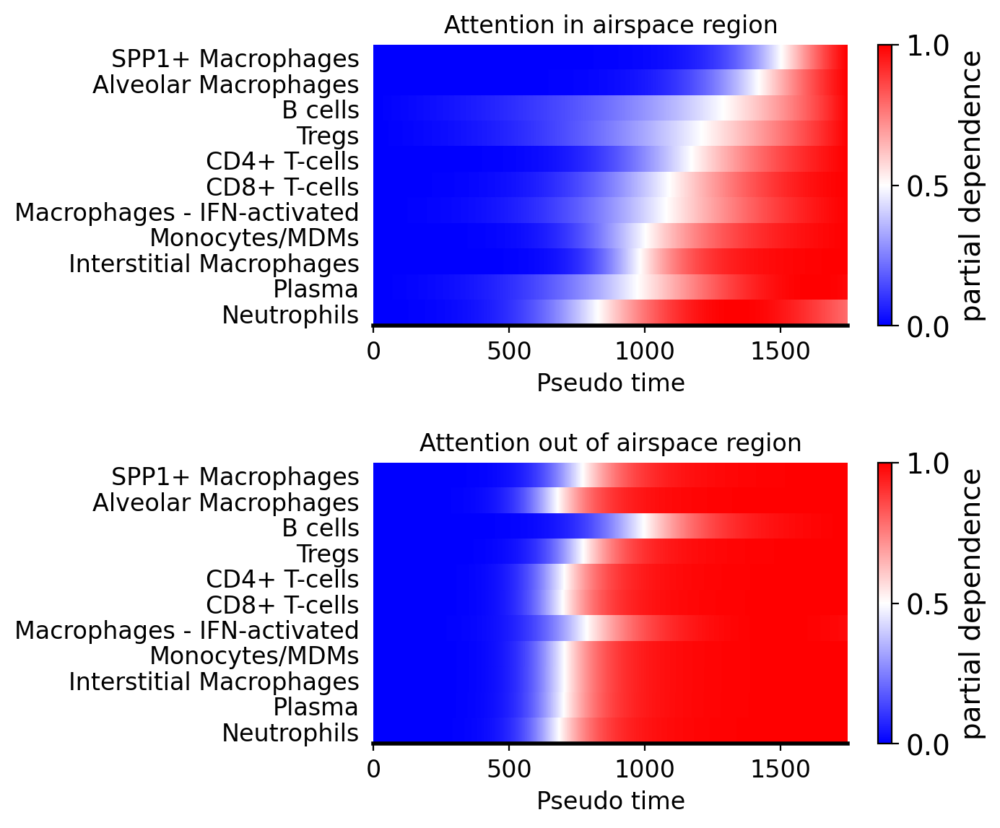

In [7]:
from pygam import LinearGAM, s
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

res_path = '/ewsc/wuqitian/analysis_pred_data/embs_attns'
with open(os.path.join(res_path, 'lumen_rank_attns.pkl'), 'rb') as f:
    lumen_rank_attns1 = pickle.load(f)
with open(os.path.join(res_path, 'lumen_rank_attns2.pkl'), 'rb') as f:
    lumen_rank_attns2 = pickle.load(f)

lumen_rank1 = lumen_rank_attns1['lumen_rank']
lumen_rank2 = lumen_rank_attns2['lumen_rank']
X1 = np.nan_to_num(lumen_rank_attns1['lumen_attns_inner_0'], nan=0.)
X2 = np.nan_to_num(lumen_rank_attns2['lumen_attns_outer_0'], nan=0.)

ct_query = 'Activated Fibrotic FBs'
ct_key = ['SPP1+ Macrophages', 'Alveolar Macrophages', 'B cells', 'Tregs', 'CD4+ T-cells', 'CD8+ T-cells',
          'Macrophages - IFN-activated', 'Monocytes/MDMs', 'Interstitial Macrophages', 'Plasma',
          'Neutrophils']

cmap = cm.bwr 

fig, axes = plt.subplots(2, 1, figsize=(7, 6))
axes = axes.flatten()

for m in range(2):
    ax = axes[m]
    X = X1 if m==0 else X2
    t = lumen_rank1.reshape(-1,1) if m==0 else lumen_rank2.reshape(-1,1)
    
    ct2ct_list = []
    pden_list = []
    p_list = []
    for ct_j in ct_key:
        i, j = ct_map[ct_query], ct_map[ct_j]
        x_ij = X[:, i, j]
        if m==0:
            x_ij = logit(x_ij)
            gam_ij = LinearGAM(s(0, n_splines=5, lam=10)).fit(t, x_ij)
            XX = gam_ij.generate_X_grid(term=0, n=1750)
            pdep = gam_ij.partial_dependence(term=0, X=XX)
            pdep = logit_inv(pdep)
        else:
            x_ij = logit(x_ij)
            gam_ij = LinearGAM(s(0, n_splines=5, lam=10)).fit(t, x_ij)
            XX = gam_ij.generate_X_grid(term=0, n=1750)
            pdep = gam_ij.partial_dependence(term=0, X=XX)
            pdep = logit_inv(pdep)
        pden_list += [pdep]
        ct2ct_list += [f'{ct_map_inv[i]} -> {ct_map_inv[j]}']
        p_list += [gam_ij.statistics_['p_values'][0]]
    
    pden_array = np.stack(pden_list, axis=0)
    
    idx_order = np.arange(0, len(ct_key))
    ct_key_order = [ct_key[i] for i in idx_order]
    pden_list_order = [pden_list[i] for i in idx_order]
    p_list_order = [p_list[i] for i in idx_order]
    for j in range(len(ct_key_order)):
        x = pden_list_order[j]
        norm = mcolors.Normalize(vmin=x.min(), vmax=x.max())
        for k, feat_val in enumerate(x):
            color = cmap(norm(feat_val))
            ax.plot([k, k], [len(ct_key_order)-j-1, len(ct_key_order)-j], color=color, linewidth=1)
    ax.set_xlim([0, len(x)-1])
    ax.set_ylim([0, len(ct_key_order)])
    ax.set_yticks([j + 0.5 for j in range(len(ct_key_order))]) 
    ax.set_yticklabels([ct_key_order[-j-1] for j in range(len(ct_key_order))])
    ax.tick_params(axis='y', labelsize=12)
    ax.tick_params(axis='x', labelsize=12)
    if m==0:
        ax.set_title(f'Attention in airspace region', fontsize=12)
    else:
        ax.set_title(f'Attention out of airspace region', fontsize=12)
    
    ax.grid(False)
    ax.tick_params(axis='both', which='both', top=False, left=False, right=False) 
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_linewidth(2)
    ax.set_xlabel('Pseudo time', fontsize=12)
    ax.set_xlim(0, 1750)
    ax.set_xticks([0, 500, 1000, 1500])

    sm = cm.ScalarMappable(cmap=cmap)
    sm.set_array([]) 
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_ticks([0.0, 0.5, 1.0])
    cbar.set_label('partial dependence')

plt.tight_layout()
plt.savefig('../../figure/attn_analysis_lung_ct_time.pdf', dpi=100)
plt.show()

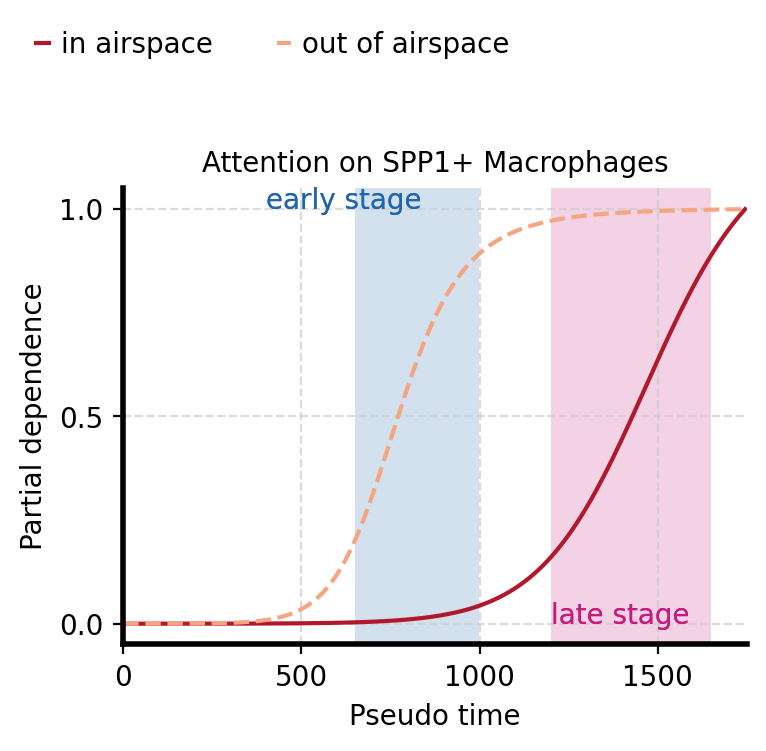

In [14]:
from pygam import LinearGAM, s
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import matplotlib.pyplot as plt

res_path = '/ewsc/wuqitian/analysis_pred_data/embs_attns'
with open(os.path.join(res_path, 'lumen_rank_attns2.pkl'), 'rb') as f: # lumen_rank_attns2, out attn only considers an outer box instead of whole slide
    lumen_rank_attns = pickle.load(f)

lumen_rank = lumen_rank_attns['lumen_rank']
lumen_attns_inner_0, lumen_attns_inner_1 = lumen_rank_attns['lumen_attns_inner_0'], lumen_rank_attns['lumen_attns_inner_1']
lumen_attns_outer_0, lumen_attns_outer_1 = lumen_rank_attns['lumen_attns_outer_0'], lumen_rank_attns['lumen_attns_outer_1']

t = lumen_rank.reshape(-1,1)

ct_query = 'Activated Fibrotic FBs'
ct_key = 'SPP1+ Macrophages'

keys = ['lumen_attns_inner_0', 'lumen_attns_outer_0']

i, j = ct_map[ct_query], ct_map[ct_key]
fig, ax = plt.subplots(figsize=(4, 3))
for k, key in enumerate(keys):
    X = np.nan_to_num(lumen_rank_attns[key], nan=0.)
    x_ij = X[:, i, j]
    x_ij = logit(x_ij)
    gam_ij = LinearGAM(s(0, n_splines=5, lam=10)).fit(t, x_ij)
    XX = gam_ij.generate_X_grid(term=0, n=1750)
    pdep = gam_ij.partial_dependence(term=0, X=XX)
    pdep = logit_inv(pdep)
    pdep = normalize(pdep)
    if k==0:
        ax.plot(XX[:, 0], pdep, label='in airspace ', linewidth=1.5, color='#b2182b')
    else:
        ax.plot(XX[:, 0], pdep, label='out of airspace', linewidth=1.5, color='#f4a582', linestyle='--')
    ax.fill_between(np.arange(650,1000,1), -0.1, 1.1, color='#2166ac', alpha=0.1, linewidth=0.)
    ax.fill_between(np.arange(1200,1650,1), -0.1, 1.1, color='#c51b7d', alpha=0.1, linewidth=0.)
    ax.text(400, 1, 'early stage', fontsize=10, color='#2166ac')
    ax.text(1200, 0, 'late stage', fontsize=10, color='#c51b7d')

    ax.set_xlabel('Pseudo time', fontsize=10)
    ax.set_ylabel(f'Partial dependence', fontsize=10)
    ax.set_title(f'Attention on {ct_key}', fontsize=10)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['left'].set_linewidth(2)
    ax.set_xlim(0, 1750)
    ax.set_xticks([0, 500, 1000, 1500])
    ax.set_ylim(-0.05, 1.05)
    ax.set_yticks([0.0, 0.5, 1.0])

ax.legend(loc='upper left', bbox_to_anchor=(-0.18, 1.4), frameon=False, ncols=2, fontsize=10)

plt.savefig('../../figure/attn_analysis_lung_macrophages_time.pdf')
plt.show()

(3, 16110, 1024) (2, 16110, 16110)


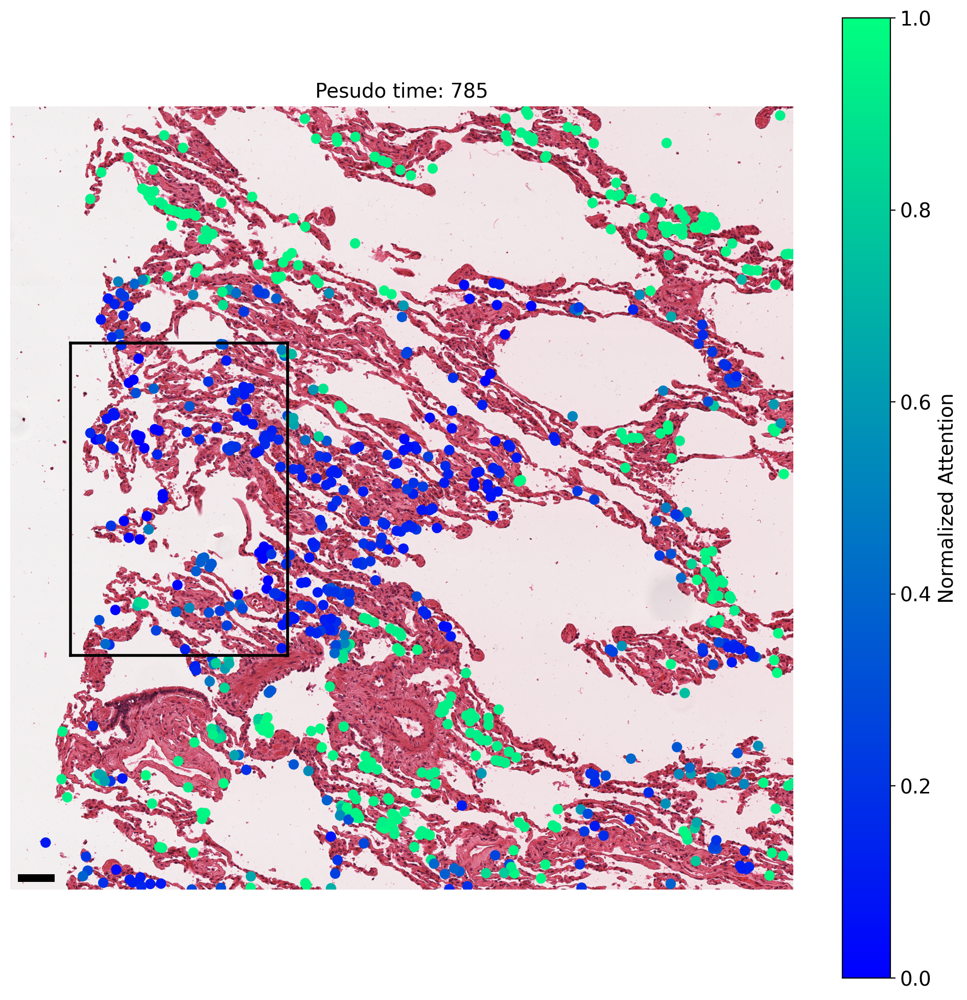

In [37]:
import matplotlib.cm as cm
import matplotlib.patches as patches

image_path = '/ewsc/wuqitian/lung/HE/'

sample = "VUHD090"

file_path = os.path.join(data_path, sample + '.h5ad')
adata = sc.read(file_path)
_, attns = get_embs_attns(adata)
attn_0, attn_1 = attns[0], attns[1]
attn_0 = (attn_0 - attn_0.min(axis=-1, keepdims=True)) / (attn_0.max(axis=-1, keepdims=True) - attn_0.min(axis=-1, keepdims=True))
attn_1 = (attn_1 - attn_1.min(axis=-1, keepdims=True)) / (attn_1.max(axis=-1, keepdims=True) - attn_1.min(axis=-1, keepdims=True))

cell_types = adata.obs['final_CT'].map(ct_map_inv).to_numpy()
lumen_ranks = adata.obs['lumen_rank'].to_numpy()

select_lumen = 785              
attn_in_score, attn_out_score = get_attn(attn_1, cell_types, lumen_ranks, select_lumen, "SPP1+ Macrophages")

files = os.listdir(image_path)

sample_image_path = None
for f in files:
    if sample in f:
        sample_image_path = f
        break
if sample_image_path is None:
    print("No image found for sample:", sample)

w_translation = 0
h_translation = 10200

image = tiff.imread(image_path+f'{f}')

cell_lumen_mask = lumen_ranks==select_lumen
idx_all = cell_lumen_mask
idx_in = cell_lumen_mask * (cell_types == "SPP1+ Macrophages")
idx_out = ~cell_lumen_mask * (cell_types == "SPP1+ Macrophages")

cell_loc_all = adata[idx_all].obsm['centroids']
cell_loc_in = adata[idx_in].obsm['centroids']
cell_loc_out = adata[idx_out].obsm['centroids']

x, y = (cell_loc_all[:, 0] - w_translation) / 0.2125, (cell_loc_all[:, 1] - h_translation) / 0.2125
x_in, y_in = (cell_loc_in[:, 0] - w_translation) / 0.2125, (cell_loc_in[:, 1] - h_translation) / 0.2125
x_out, y_out = (cell_loc_out[:, 0] - w_translation) / 0.2125, (cell_loc_out[:, 1] - h_translation) / 0.2125

x_cen = round(x_in.mean())
y_cen = round(y_in.mean())

x_min, x_max = x_cen - 2000, x_cen + 8000
y_min, y_max = y_cen - 5000, y_cen + 5000
idx_in_sub = (x_out >= x_min) & (x_out <= x_max) & (y_out >= y_min) & (y_out <= y_max)
x_out = x_out[idx_in_sub]
y_out = y_out[idx_in_sub]

image_sub = image[y_min:y_max, x_min:x_max]
x_in = x_in - x_min
y_in = y_in - y_min
x_out = x_out - x_min
y_out = y_out - y_min

lumen_offset = 200
x_lumen_min, x_lumen_max = round(x.min()) - lumen_offset - x_min, round(x.max()) + lumen_offset - x_min
y_lumen_min, y_lumen_max = round(y.min()) - lumen_offset - y_min, round(y.max()) + lumen_offset - y_min

fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(image_sub)

cmap = cm.winter 
x_all = np.concatenate([x_in, x_out])
y_all = np.concatenate([y_in, y_out])
attn_all = np.concatenate([attn_in_score, attn_out_score[idx_in_sub]])

plt.scatter(x_all, y_all, s=40, c=attn_all, cmap=cmap, marker='o', vmin=0, vmax=1, label='m')

# draw lumen area: 4 lines to form a rectangle
plt.plot([x_lumen_min, x_lumen_max], [y_lumen_min, y_lumen_min], color='black', linewidth=2.0)
plt.plot([x_lumen_min, x_lumen_max], [y_lumen_max, y_lumen_max], color='black', linewidth=2.0)
plt.plot([x_lumen_min, x_lumen_min], [y_lumen_min, y_lumen_max], color='black', linewidth=2.0)
plt.plot([x_lumen_max, x_lumen_max], [y_lumen_min, y_lumen_max], color='black', linewidth=2.0)

rect = patches.Rectangle((0.01, 0.01), 1 / (image_sub.shape[0] * 0.2125) * 100, 0.01, transform=ax.transAxes, facecolor='black')
ax.add_patch(rect)

plt.colorbar(label='Normalized Attention')
plt.axis('off')
plt.grid(False)
# plt.legend()
plt.title(f"Pesudo time: {select_lumen}")

plt.tight_layout()
plt.show()

(3, 52992, 1024) (2, 52992, 52992)


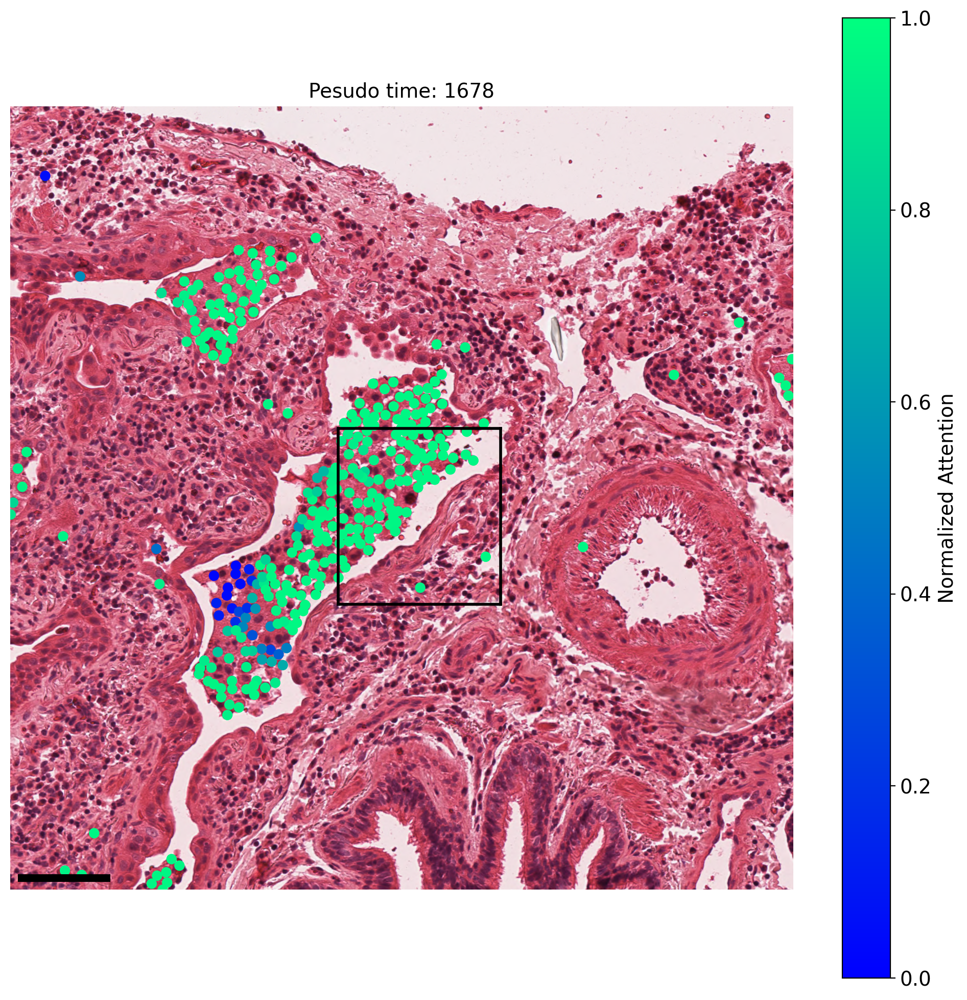

In [42]:
import matplotlib.cm as cm
import matplotlib.patches as patches

image_path = '/ewsc/wuqitian/lung/HE/'

sample = "TILD299MA"

file_path = os.path.join(data_path, sample + '.h5ad')
adata = sc.read(file_path)
_, attns = get_embs_attns(adata)
attn_0, attn_1 = attns[0], attns[1]
attn_0 = (attn_0 - attn_0.min(axis=-1, keepdims=True)) / (attn_0.max(axis=-1, keepdims=True) - attn_0.min(axis=-1, keepdims=True))
attn_1 = (attn_1 - attn_1.min(axis=-1, keepdims=True)) / (attn_1.max(axis=-1, keepdims=True) - attn_1.min(axis=-1, keepdims=True))

cell_types = adata.obs['final_CT'].map(ct_map_inv).to_numpy()
lumen_ranks = adata.obs['lumen_rank'].to_numpy()

select_lumen = 1678              
attn_in_score, attn_out_score = get_attn(attn_1, cell_types, lumen_ranks, select_lumen, "SPP1+ Macrophages")

files = os.listdir(image_path)

sample_image_path = None
for f in files:
    if sample in f:
        sample_image_path = f
        break
if sample_image_path is None:
    print("No image found for sample:", sample)

w_translation = 4080
h_translation = 13175

image = tiff.imread(image_path+f'{f}')

cell_lumen_mask = lumen_ranks==select_lumen
idx_all = cell_lumen_mask
idx_in = cell_lumen_mask * (cell_types == "SPP1+ Macrophages")
idx_out = ~cell_lumen_mask * (cell_types == "SPP1+ Macrophages")

cell_loc_all = adata[idx_all].obsm['centroids']
cell_loc_in = adata[idx_in].obsm['centroids']
cell_loc_out = adata[idx_out].obsm['centroids']

x, y = (cell_loc_all[:, 0] - w_translation) / 0.2125, (cell_loc_all[:, 1] - h_translation) / 0.2125
x_in, y_in = (cell_loc_in[:, 0] - w_translation) / 0.2125, (cell_loc_in[:, 1] - h_translation) / 0.2125
x_out, y_out = (cell_loc_out[:, 0] - w_translation) / 0.2125, (cell_loc_out[:, 1] - h_translation) / 0.2125

x_cen = round(x_in.mean())
y_cen = round(y_in.mean())

x_min, x_max = x_cen - 2000, x_cen + 2000
y_min, y_max = y_cen - 2000, y_cen + 2000
idx_in_sub = (x_out >= x_min) & (x_out <= x_max) & (y_out >= y_min) & (y_out <= y_max)
x_out = x_out[idx_in_sub]
y_out = y_out[idx_in_sub]

image_sub = image[y_min:y_max, x_min:x_max]
x_in = x_in - x_min
y_in = y_in - y_min
x_out = x_out - x_min
y_out = y_out - y_min

lumen_offset = 200
x_lumen_min, x_lumen_max = round(x.min()) - lumen_offset - x_min, round(x.max()) + lumen_offset - x_min
y_lumen_min, y_lumen_max = round(y.min()) - lumen_offset - y_min, round(y.max()) + lumen_offset - y_min

fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(image_sub)

cmap = cm.winter 
x_all = np.concatenate([x_in, x_out])
y_all = np.concatenate([y_in, y_out])
attn_all = np.concatenate([attn_in_score, attn_out_score[idx_in_sub]])

plt.scatter(x_all, y_all, s=40, c=attn_all, cmap=cmap, marker='o', vmin=0, vmax=1, label='m')

# draw lumen area: 4 lines to form a rectangle
plt.plot([x_lumen_min, x_lumen_max], [y_lumen_min, y_lumen_min], color='black', linewidth=2.0)
plt.plot([x_lumen_min, x_lumen_max], [y_lumen_max, y_lumen_max], color='black', linewidth=2.0)
plt.plot([x_lumen_min, x_lumen_min], [y_lumen_min, y_lumen_max], color='black', linewidth=2.0)
plt.plot([x_lumen_max, x_lumen_max], [y_lumen_min, y_lumen_max], color='black', linewidth=2.0)

rect = patches.Rectangle((0.01, 0.01), 1 / (image_sub.shape[0] * 0.2125) * 100, 0.01, transform=ax.transAxes, facecolor='black')
ax.add_patch(rect)

plt.colorbar(label='Normalized Attention')
plt.axis('off')
plt.grid(False)
# plt.legend()
plt.title(f"Pesudo time: {select_lumen}")

plt.tight_layout()
plt.show()